In [1]:
# Загружаем необходимые библиотеки и модули
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import scipy

# Sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, explained_variance_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

# Tensorflow
import tensorflow as tf
from tensorflow import keras 
from keras.models import Sequential
from keras.layers import Dense, Dropout, BatchNormalization, Activation

### Загрузка и исследование данных

In [2]:
# Загружаем исходный датасет "X_bp", удаляем безымянный столбец
data_bp = pd.read_excel('X_bp.xlsx', index_col=0)

In [3]:
# Отобразим первые 5 строк датасета
data_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [4]:
# Смотрим количество строк и столбцов (переменных) в датасете "X_bp"
data_bp.shape

(1023, 10)

In [5]:
# Загружаем исходный датасет "X_nup", удаляем безымянный столбец
data_nup = pd.read_excel('X_nup.xlsx', index_col=0)

In [6]:
# Отобразим первые 5 строк датасета
data_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [7]:
# Смотрим количество строк и столбцов (переменных) в датасете "X_nup"
data_nup.shape

(1040, 3)

In [8]:
# Объединяем два датасета в один по типу INNER.
data = data_bp.merge(data_nup, left_index=True, right_index=True, how='inner')

In [9]:
# Отобразим первые 5 строк датасета
data.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [10]:
# Смотрим количество строк и столбцов (переменных) в датасете
data.shape

(1023, 13)

In [11]:
# Проверим датасет на дубликаты
data.duplicated().sum()

0

In [12]:
# Проверим есть ли пропущенные значения
data.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [13]:
# Выведем информацию о датасете
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [14]:
# Практически все переменные имеют значения float64(число с плавающей точкой), за исключением переменной "Угол нашивки, град"
# имеющую значение int64(целые числа). Пропусков не имеется. Очистка не требуется.

In [15]:
# Выведем описательную статистику 
data.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.93,0.91,0.39,2.32,2.91,3.55,5.59
"Плотность, кг/м3",1023.0,1975.73,73.73,1731.76,1924.16,1977.62,2021.37,2207.77
"модуль упругости, ГПа",1023.0,739.92,330.23,2.44,500.05,739.66,961.81,1911.54
"Количество отвердителя, м.%",1023.0,110.57,28.30,17.74,92.44,110.56,129.73,198.95
"Содержание эпоксидных групп,%_2",1023.0,22.24,2.41,14.25,20.61,22.23,23.96,33.00
"Температура вспышки, С_2",1023.0,285.88,40.94,100.00,259.07,285.90,313.00,413.27
"Поверхностная плотность, г/м2",1023.0,482.73,281.31,0.60,266.82,451.86,693.23,1399.54
"Модуль упругости при растяжении, ГПа",1023.0,73.33,3.12,64.05,71.25,73.27,75.36,82.68
"Прочность при растяжении, МПа",1023.0,2466.92,485.63,1036.86,2135.85,2459.52,2767.19,3848.44
"Потребление смолы, г/м2",1023.0,218.42,59.74,33.80,179.63,219.20,257.48,414.59


In [16]:
# Смотрим уникальные значения
data.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [17]:
# Во всех переменных содержится множество уникальных значения, только в переменной "Угол нашивки, град" их 2

### Разведочный анализ данных (EDA)

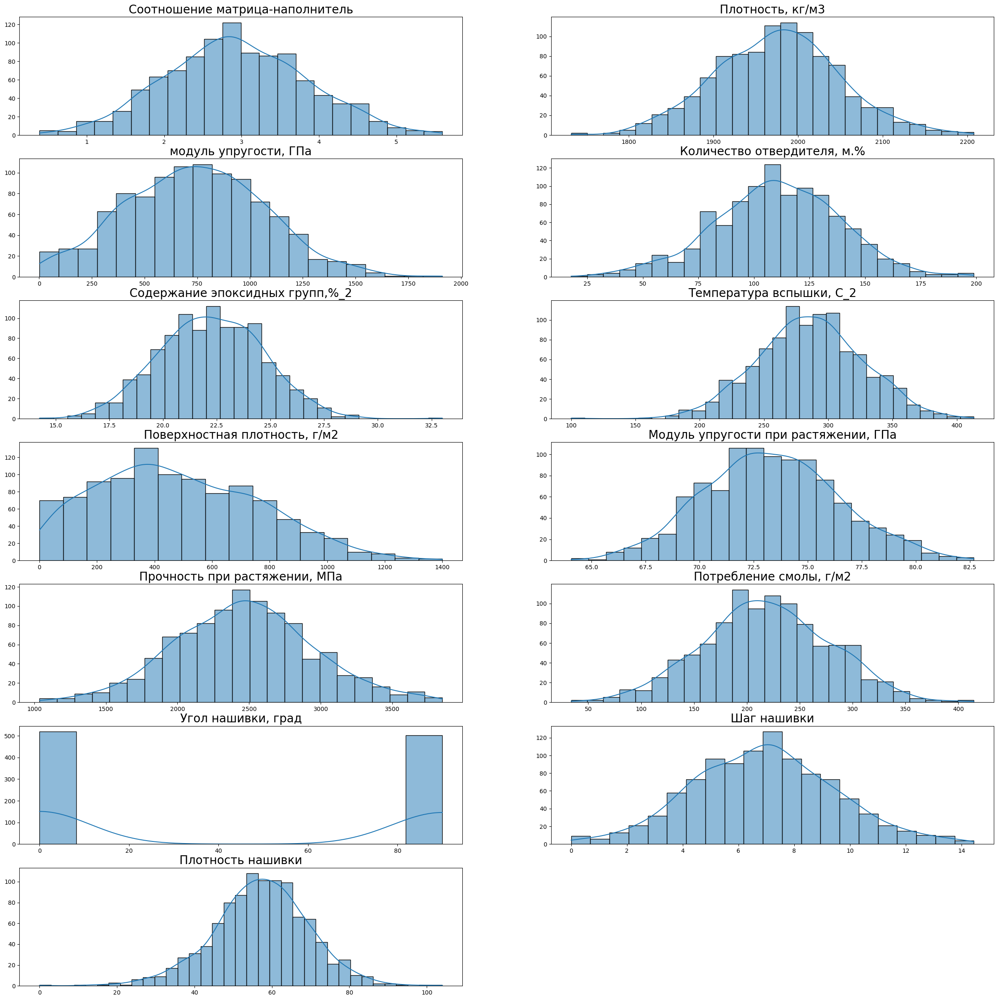

In [18]:
# Построим гистограммы для переменных в датасете
plt.figure(figsize=(30,30))
vertic = 7   # кол-во графиков по вертикали
horiz  = 2   # кол-во графиков по горизонтали
count  = 1   # порядковый номер графика

for col in data.columns:
    plt.subplot(vertic, horiz, count)
    sns.histplot(data = data[col], kde=True)
    plt.xlabel(None)
    plt.ylabel(None)
    plt.title(col, size = 20)
    count += 1

In [19]:
# Для 12 из 13 параметров распределение имеет вид "нормального распределения". Параметр "Угол нашивки, град" принимает дискретные 
# значения 0 и 90. Не будем присваивать им метки классов 0 и 1, т.к. при нормализации они также примут значения 0 и 1.

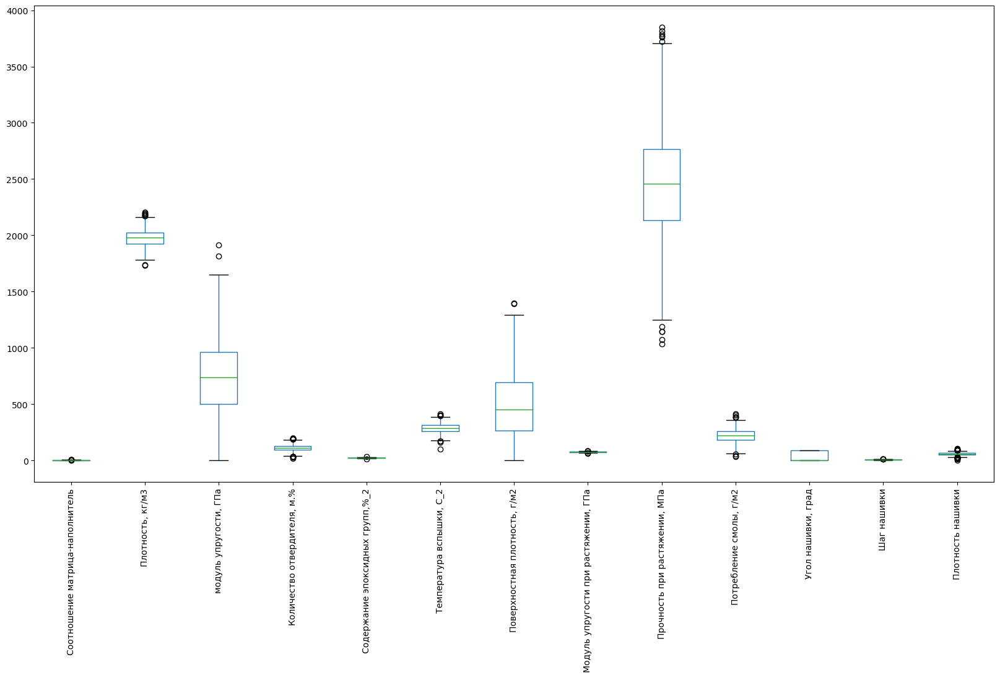

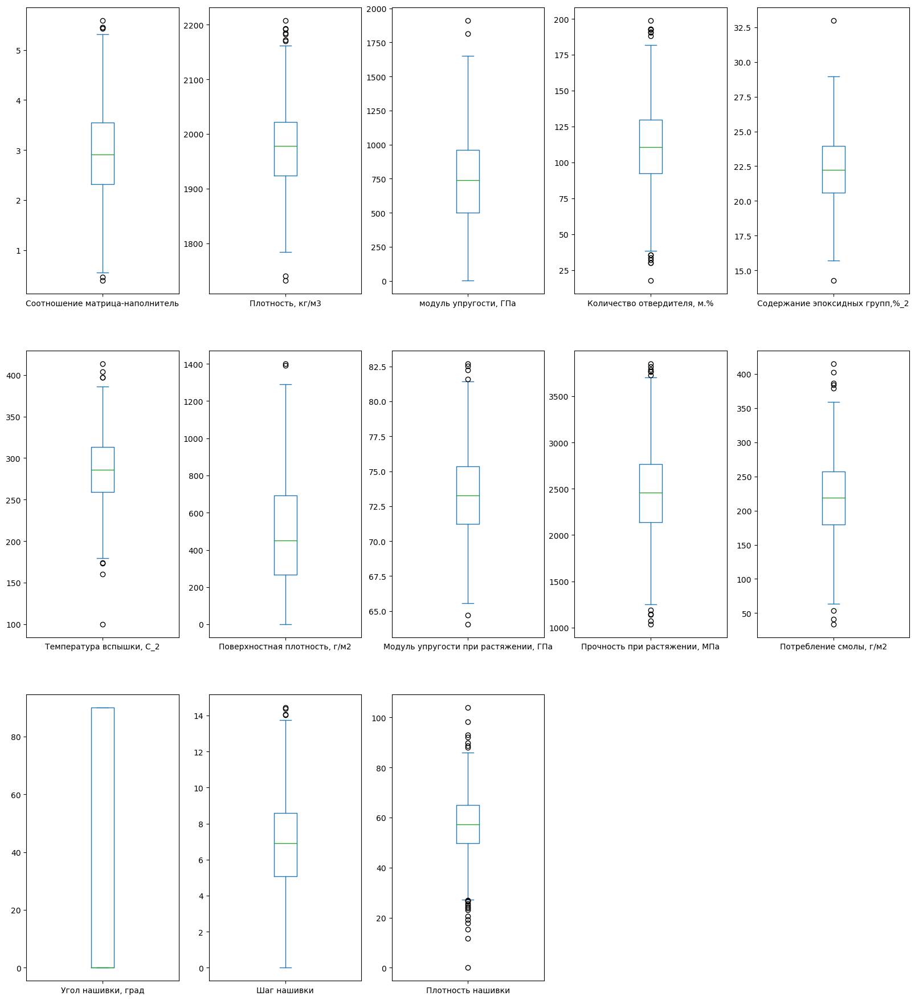

In [20]:
# Построим "ящики с усами" для переменных датасета
boxplot = data.boxplot(column=['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа','Количество отвердителя, м.%',
                               'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 
                               'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 
                               'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'], figsize = (20,10), grid=False, rot = 90) 
# Построим более подробно "ящики с усами" для переменных датасета
fig=plt.figure(figsize=(20, 30))
ax=fig.add_subplot(4, 5, 1)
data['Соотношение матрица-наполнитель'].plot.box()
ax=fig.add_subplot(4, 5, 2)
data['Плотность, кг/м3'].plot.box()
ax=fig.add_subplot(4, 5, 3)
data['модуль упругости, ГПа'].plot.box()
ax=fig.add_subplot(4, 5, 4)
data['Количество отвердителя, м.%'].plot.box()
ax=fig.add_subplot(4, 5, 5)
data['Содержание эпоксидных групп,%_2'].plot.box()
ax=fig.add_subplot(4, 5, 6)
data['Температура вспышки, С_2'].plot.box()
ax=fig.add_subplot(4, 5, 7)
data['Поверхностная плотность, г/м2'].plot.box()
ax=fig.add_subplot(4, 5, 8)
data['Модуль упругости при растяжении, ГПа'].plot.box()
ax=fig.add_subplot(4, 5, 9)
data['Прочность при растяжении, МПа'].plot.box()
ax=fig.add_subplot(4, 5, 10)
data['Потребление смолы, г/м2'].plot.box()
ax=fig.add_subplot(4, 5, 11)
data['Угол нашивки, град'].plot.box()
ax=fig.add_subplot(4, 5, 12)
data['Шаг нашивки'].plot.box()
ax=fig.add_subplot(4, 5, 13)
data['Плотность нашивки'].plot.box()
plt.show()

In [21]:
# "Ящики с усами" показывают наличие выбросов во всех столбцах, кроме "Углов нашивки, град"

In [22]:
# Выводим корреляцию между переменными
corr = data.corr().round(3)
corr

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000,0.004,0.032,-0.006,0.020,-0.005,-0.006,-0.008,0.024,0.073,-0.031,0.036,-0.005
"Плотность, кг/м3",0.004,1.000,-0.010,-0.036,-0.008,-0.021,0.045,-0.018,-0.070,-0.016,-0.068,-0.061,0.080
"модуль упругости, ГПа",0.032,-0.010,1.000,0.024,-0.007,0.031,-0.005,0.023,0.042,0.002,-0.025,-0.010,0.056
"Количество отвердителя, м.%",-0.006,-0.036,0.024,1.000,-0.001,0.095,0.055,-0.066,-0.075,0.007,0.039,0.015,0.017
"Содержание эпоксидных групп,%_2",0.020,-0.008,-0.007,-0.001,1.000,-0.010,-0.013,0.057,-0.024,0.015,0.008,0.003,-0.039
"Температура вспышки, С_2",-0.005,-0.021,0.031,0.095,-0.010,1.000,0.020,0.028,-0.032,0.060,0.021,0.026,0.011
"Поверхностная плотность, г/м2",-0.006,0.045,-0.005,0.055,-0.013,0.020,1.000,0.037,-0.003,0.016,0.052,0.038,-0.050
"Модуль упругости при растяжении, ГПа",-0.008,-0.018,0.023,-0.066,0.057,0.028,0.037,1.000,-0.009,0.051,0.023,-0.029,0.006
"Прочность при растяжении, МПа",0.024,-0.070,0.042,-0.075,-0.024,-0.032,-0.003,-0.009,1.000,0.029,0.023,-0.060,0.020
"Потребление смолы, г/м2",0.073,-0.016,0.002,0.007,0.015,0.060,0.016,0.051,0.029,1.000,-0.015,0.013,0.012


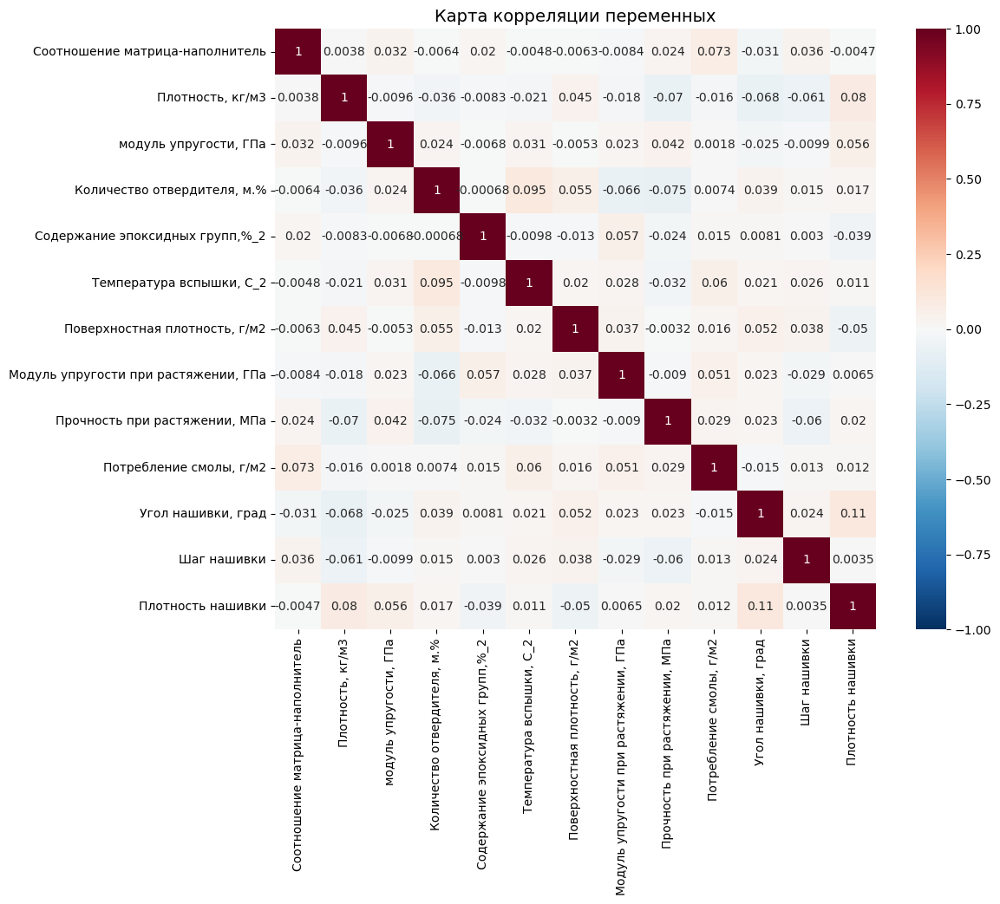

In [23]:
# Визуализируем корреляционную матрицу с помощью тепловой карты
corr = data.corr()
plt.figure(figsize=(12,9))
sns.heatmap(data.corr(), cmap='RdBu_r', vmin=-1, vmax=1, square=True, annot=True)
plt.title("Карта корреляции переменных", fontsize=14)
plt.show()

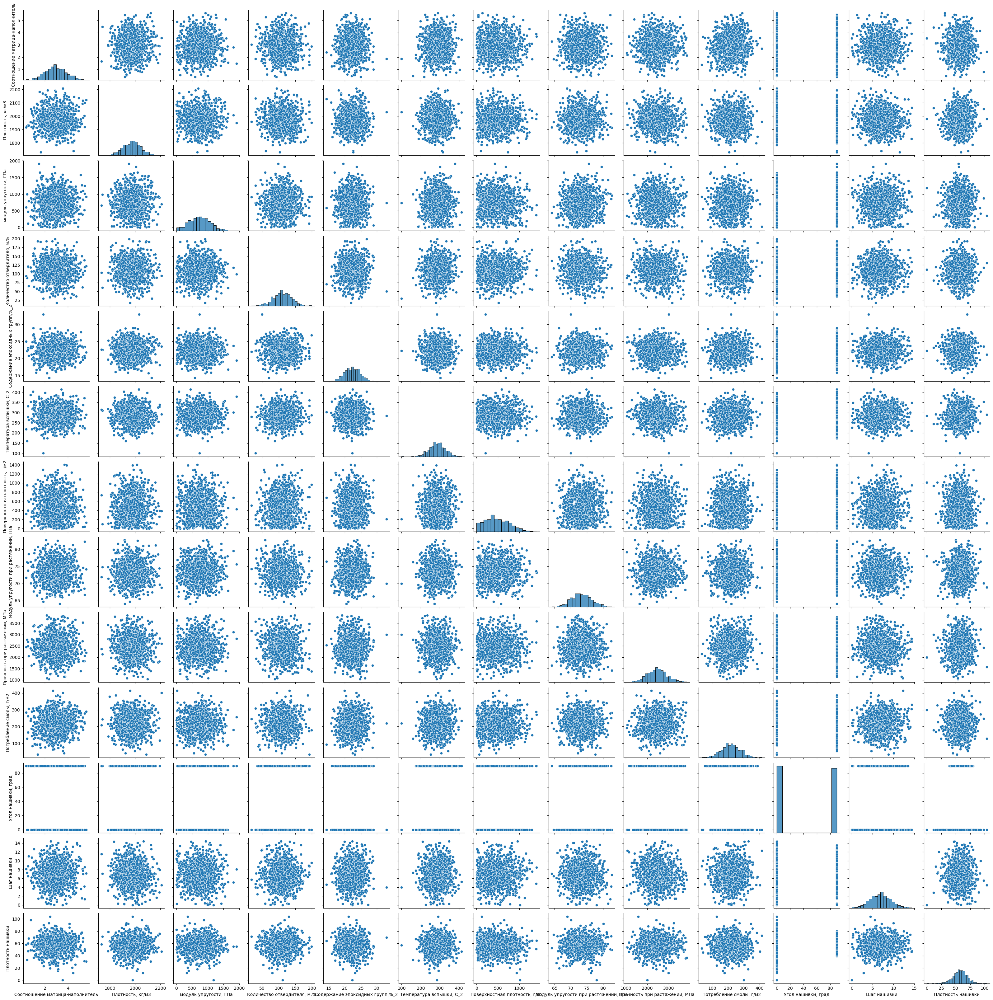

In [24]:
# Построим попарные графики рассеяния точек
sns.pairplot(data)

In [25]:
# Из построенных графиков видно, что в представленных данных нет каких-либо ярко выраженных зависимостей между данными.
# Данные соответствуют нормальному распределению, за исключением "Угол нашивки, град"
# На графиках можно наблюдать выбросы, потому что некоторые точки располагаются далеко от общего облака

### Предобработка данных

In [26]:
# Удаляем (исключаем) выбросы

In [27]:
data_cl = data.copy()

In [28]:
for column in data_cl.columns:
    q75, q25 = np.percentile(a=data_cl[column], q=[75,25])
    intr_qr = q75-q25
    
    min = q25-(1.5*intr_qr)
    max = q75+(1.5*intr_qr)
    data_cl.loc[data_cl[column] < min, column] = np.nan
    data_cl.loc[data_cl[column] > max, column] = np.nan
    
data_cl.dropna(inplace=True)

In [29]:
data_cl.shape

(936, 13)

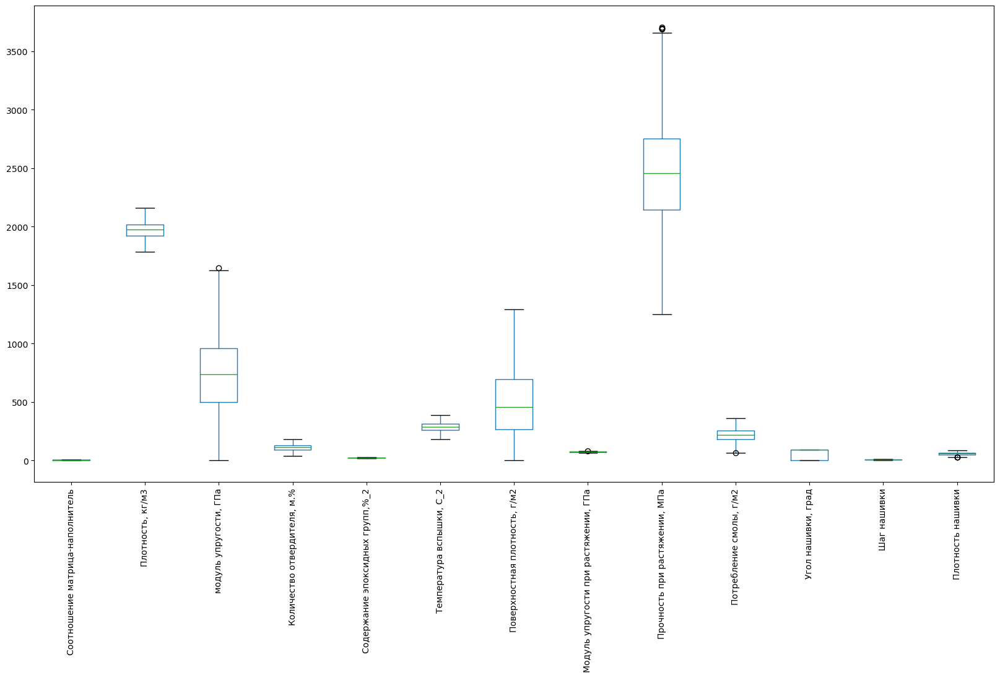

In [30]:
# Отобразим данные после очистки от выбросов с помощью "Ящиков с усами"
boxplot = data_cl.boxplot(column=['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа','Количество отвердителя, м.%',
                               'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 
                               'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 
                               'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'], figsize = (20,10), grid=False, rot = 90) 

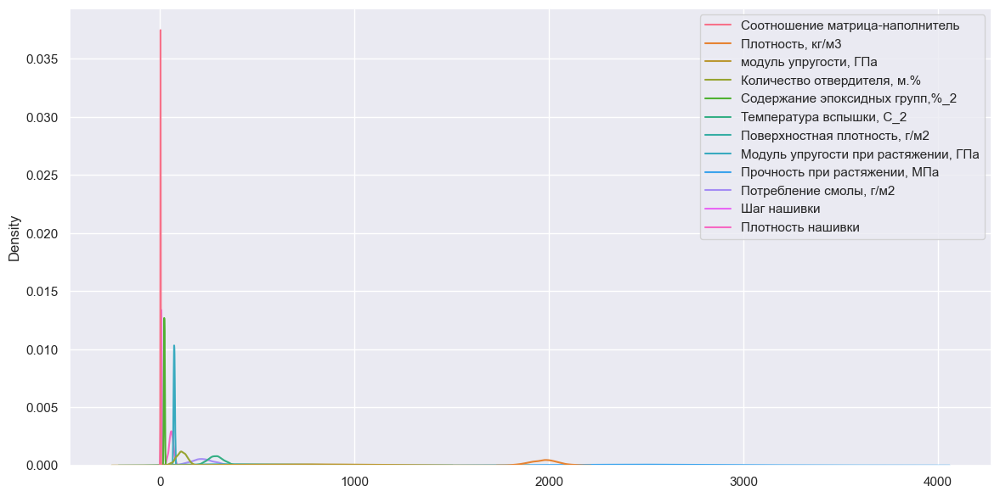

In [31]:
# Оценим плотность ядра. Построим графики распределения для каждой переменной (Угол нашивки не рассматривается)
sns.set(font_scale=1)
plt.figure(figsize = (14,7))
sns.kdeplot(data=data_cl.drop(labels='Угол нашивки, град', axis = 1))
plt.show()

In [32]:
# Нормализуем данные с помощью MinMaxScaler. Преобразуем их путем масштабирования переменных до диапазона от 0 до 1
scaler = MinMaxScaler()
names = data_cl.columns
norm = scaler.fit_transform(data_cl)
data_ncl = pd.DataFrame(norm, columns=names)
data_ncl.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.289334,0.557156
1,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.335840
2,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.506083
3,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.557156
4,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.727399


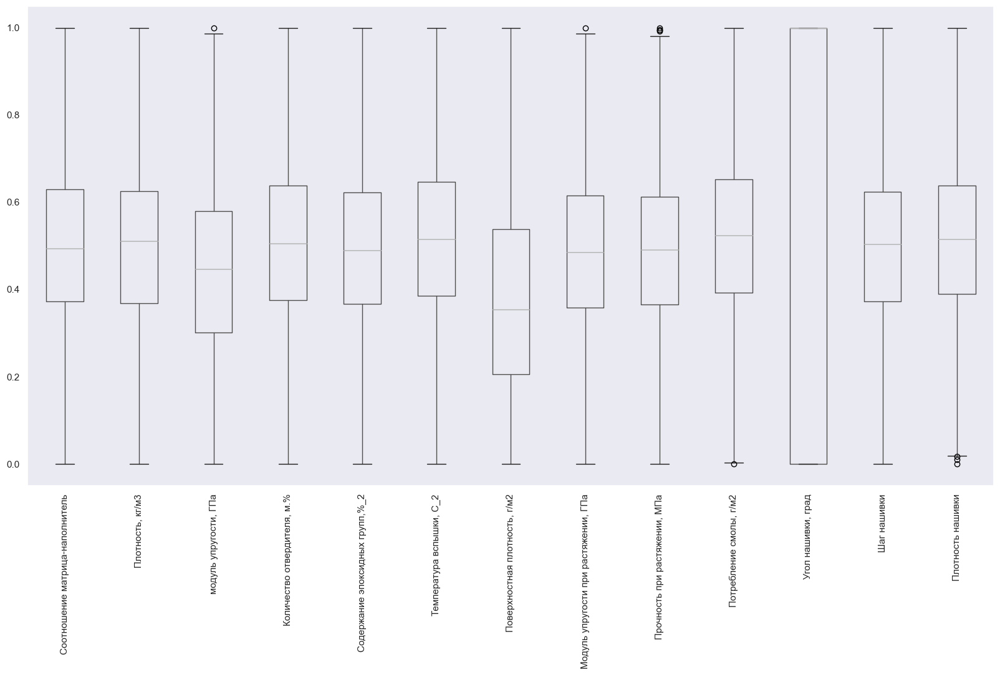

In [33]:
# Отобразим нормализованные данные с помощью "Ящиков с усами"
boxplot = data_ncl.boxplot(column=['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа','Количество отвердителя, м.%',
                               'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 
                               'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 
                               'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'], figsize = (20,10), grid=False, rot = 90) 

In [34]:
# Самые сильные выбросы удалены

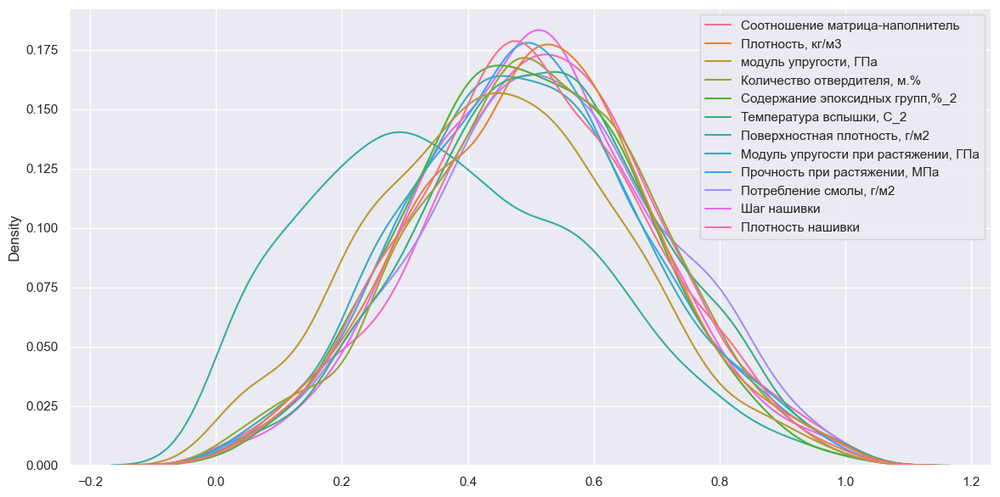

In [35]:
# Построим графики распределения для каждой переменной на нормализованных данных (Угол нашивки не рассматривается)
sns.set(font_scale=1)
plt.figure(figsize = (14,7))
sns.kdeplot(data=data_ncl.drop(labels='Угол нашивки, град', axis = 1))
plt.show()

### Разработка и обучение моделей прогнозирующих "Модуль упругости при растяжении" и "Прочность при растяжении"

Создадим 2 датасета для прогнозирования "Модуля упругости при растяжении, ГПа" (data_mod) и "Прочности при растяжении, МПа" (data_pr). Исключим из data_mod переменную "Прочность при растяжении", а из data_pr "Модуля упругости при растяжении". Таким образом результирующие переменные не будут влиять на результат.

In [36]:
# Создадим датасет "data_mod", из которого исключим перенную "Прочность при растяжении, МПа"
data_mod = data_ncl.drop(['Прочность при растяжении, МПа'], axis = 1)
data_mod.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.280303,0.529221,0.0,0.289334,0.557156
1,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.280303,0.529221,0.0,0.362355,0.335840
2,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.280303,0.529221,0.0,0.362355,0.506083
3,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.280303,0.529221,0.0,0.362355,0.557156
4,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.280303,0.529221,0.0,0.362355,0.727399


In [37]:
# Создадим датасет "data_pr", из которого исключим перенную "Модуль упругости при растяжении, ГПа",
data_pr = data_ncl.drop(['Модуль упругости при растяжении, ГПа'], axis = 1)
data_pr.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.71259,0.529221,0.0,0.289334,0.557156
1,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.71259,0.529221,0.0,0.362355,0.335840
2,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.71259,0.529221,0.0,0.362355,0.506083
3,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.71259,0.529221,0.0,0.362355,0.557156
4,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.71259,0.529221,0.0,0.362355,0.727399


In [38]:
# Записываем независимые переменные из "data_mod" в "X_mod", а зависимую "Модуль упругости при растяжении, ГПа" в "y_mod"

X_mod = data_mod.drop(['Модуль упругости при растяжении, ГПа'], axis = 1)
y_mod = data_mod['Модуль упругости при растяжении, ГПа']

In [39]:
# Записываем независимые переменные из data_pr в X_pr, а зависимую "Прочности при растяжении, МПа" в y_pr

X_pr = data_pr.drop(['Прочность при растяжении, МПа'], axis = 1)
y_pr = data_pr['Прочность при растяжении, МПа']

### Разделение данных на x и у

In [40]:
# Делим данные из data_mod на тренировочную и тестовую выборки, выделяя предикторы и целевую переменную
# Целевая переменная в data_mod - "Модуль упругости при растяжении, ГПа"

X_mod_train, X_mod_test, y_mod_train, y_mod_test = train_test_split(X_mod, y_mod, test_size = 0.30, random_state=42)

In [41]:
# Проверка правильности разбивки

print("Форма тренировочной выборки data_mod: ",  X_mod_train.shape)
print("Форма тестового выборки data_mod: ", X_mod_test.shape)

data_mod.shape[0] - X_mod_train.shape[0] - X_mod_test.shape[0]

Форма тренировочной выборки data_mod:  (655, 11)
Форма тестового выборки data_mod:  (281, 11)


0

In [42]:
# Делим данные из data_pr на тренировочную и тестовую выборки, выделяя предикторы и целевую переменную
# Целевая переменная в data_pr - "Прочности при растяжении, МПа"

X_pr_train, X_pr_test, y_pr_train, y_pr_test = train_test_split(X_pr, y_pr, test_size = 0.30, random_state=42)

In [43]:
# Проверка правильности разбивки

print("Форма тренировочной выборки data_pr: ",  X_pr_train.shape)
print("Форма тестового выборки data_pr: ", X_pr_test.shape)

data_pr.shape[0] - X_pr_train.shape[0] - X_pr_test.shape[0]

Форма тренировочной выборки data_pr:  (655, 11)
Форма тестового выборки data_pr:  (281, 11)


0

### Linear Regression (Линейная регрессия)

#### Прогноз "Модуля упругости при растяжении, ГПа" (data_mod)

In [44]:
# Обучим модель (таргет - Модуль упругости при растяжении, ГПа)

lin_reg = LinearRegression(fit_intercept= True, positive= True)
lin_reg.fit(X_mod_train, y_mod_train)

LinearRegression(positive=True)

In [45]:
# Рассчитываем score для тренировочной выборки (y - Модуль упругости при растяжении, ГПа)
print("Train score:", lin_reg.score(X_mod_train, y_mod_train))

Train score: 0.009843996759737128


In [46]:
# Предсказывем значения для "Модуля упругости при растяжении, ГПа"
y_mod_pred_lin = lin_reg.predict(X_mod_test)

In [47]:
# Выводим результаты модели (таргет - Модуля упругости при растяжении, ГПа)
print('MAE:', mean_absolute_error(y_mod_test, y_mod_pred_lin)) 
print('MSE:', mean_squared_error(y_mod_test, y_mod_pred_lin)) 
print('r2:', r2_score(y_mod_test, y_mod_pred_lin))

MAE: 0.15182429130754063
MSE: 0.034828465373070557
r2: -0.005818112112379259


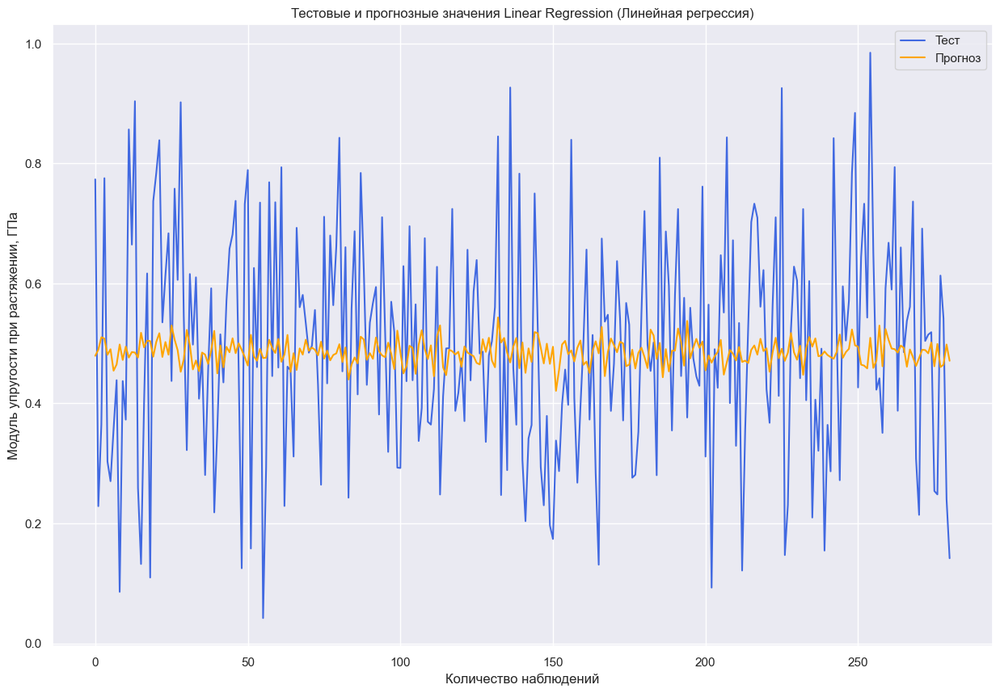

In [48]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения Linear Regression (Линейная регрессия)")
plt.plot(y_mod_test.values, label = "Тест", color = 'royalblue')
plt.plot(y_mod_pred_lin, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend(loc='best')
plt.show()

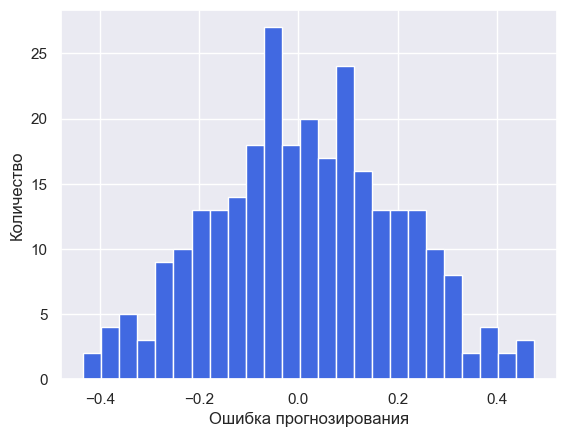

In [49]:
# Построим график распределения ошибки (таргет - Модуля упругости при растяжении, ГПа)
error = y_mod_test - y_mod_pred_lin
plt.hist(error, bins=25, color = 'royalblue')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

#### Прогноз "Прочность при растяжении, МПа" (data_pr)

In [50]:
# Обучим модель (таргет - Прочности при растяжении, МПа)

lin_reg= LinearRegression(fit_intercept= True, positive= True)
lin_reg.fit(X_pr_train, y_pr_train)

LinearRegression(positive=True)

In [51]:
# Рассчитываем score для тренировочной выборки (y - Прочности при растяжении, МПа)
print("Train score:", lin_reg.score(X_pr_train, y_pr_train))

Train score: 0.00443233795797815


In [52]:
# Предсказывем значения для "Прочности при растяжении, МПа"
y_pr_pred_lin = lin_reg.predict(X_pr_test)

In [53]:
# Выводим результаты модели (таргет - Прочности при растяжении, МПа)
print('MAE:', mean_absolute_error(y_pr_test, y_pr_pred_lin)) 
print('MSE:', mean_squared_error(y_pr_test, y_pr_pred_lin)) 
print('r2:', r2_score(y_pr_test, y_pr_pred_lin))

MAE: 0.14742280952782494
MSE: 0.03533288897982116
r2: -0.043577112682434915


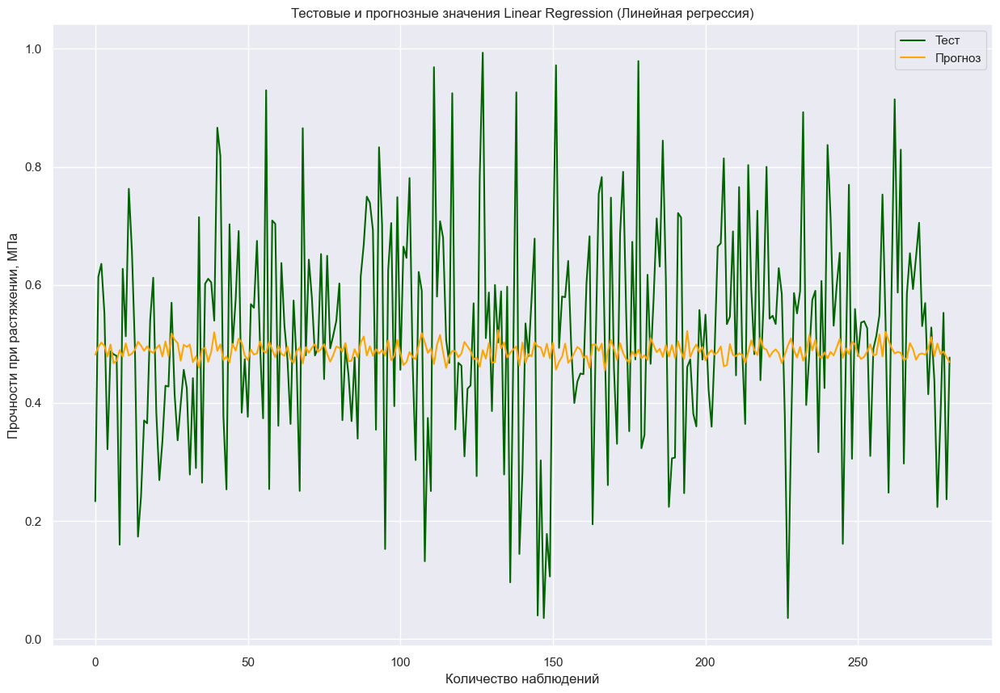

In [54]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения Linear Regression (Линейная регрессия)")
plt.plot(y_pr_test.values, label = "Тест", color = 'darkgreen')
plt.plot(y_pr_pred_lin, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочности при растяжении, МПа")
plt.legend(loc='best')
plt.show()

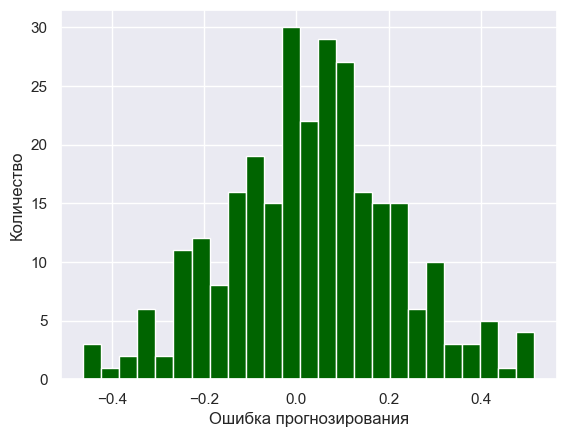

In [55]:
# Построим график распределения ошибки (таргет - Прочности при растяжении, МПа)
error = y_pr_test - y_pr_pred_lin
plt.hist(error, bins=25, color = 'darkgreen')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

### Decision Tree Regressor (Деревья решений)

#### Прогноз "Модуля упругости при растяжении, ГПа" (data_mod)

In [56]:
dtr = DecisionTreeRegressor()

In [57]:
# Создаем выбор параметров глубины дерева  
param_dtr = {
    'max_depth': [2, 4, 5],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'splitter' : ['best', 'random']
}

In [58]:
# Создаем grid search модель
grid_search_dtr = GridSearchCV(estimator = dtr, param_grid = param_dtr, cv = 10)

In [59]:
# Обучаем модель (таргет - Модуля упругости при растяжении, ГПа)

grid_search_dtr.fit(X_mod_train, y_mod_train);

In [60]:
# Ищем наилучшие параметры для модели

grid_search_dtr.best_params_

{'criterion': 'poisson', 'max_depth': 2, 'splitter': 'random'}

In [61]:
# Рассчитываем score для тренировочной выборки (таргет - Модуля упругости при растяжении, ГПа)
print("Train score:",grid_search_dtr.score(X_mod_train, y_mod_train))

Train score: 0.003618495044408254


In [62]:
# Предсказываем y по тестовой выборке X_mod_test (таргет - Модуля упругости при растяжении, ГПа)
y_mod_pred_dtr = grid_search_dtr.predict(X_mod_test)

In [63]:
# Выводим результаты модели (таргет - Модуля упругости при растяжении, ГПа)
print('MAE:', mean_absolute_error(y_mod_test, y_mod_pred_dtr)) 
print('MSE:', mean_squared_error(y_mod_test, y_mod_pred_dtr)) 
print('r2:', r2_score(y_mod_test, y_mod_pred_dtr))

MAE: 0.15113438695516643
MSE: 0.03470163082768918
r2: -0.002155232292105236


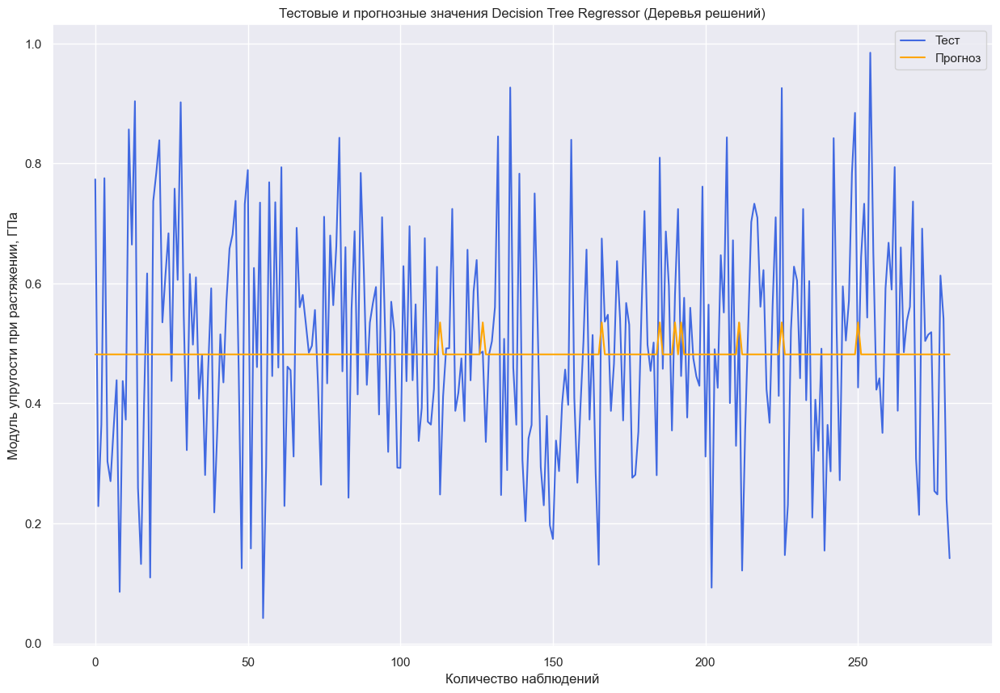

In [64]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения Decision Tree Regressor (Деревья решений)")
plt.plot(y_mod_test.values, label = "Тест", color = 'royalblue')
plt.plot(y_mod_pred_dtr, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend(loc='best')
plt.show()

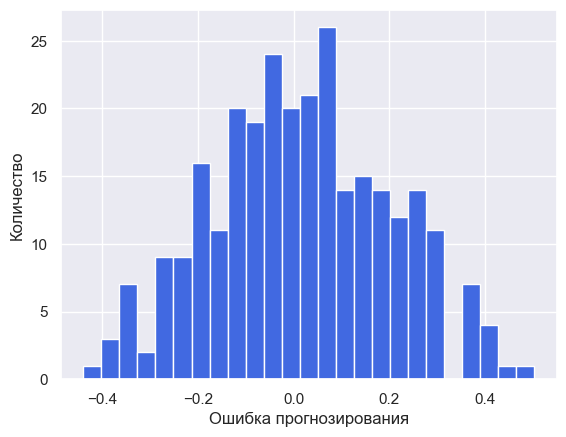

In [65]:
# Построим график распределения ошибки (таргет - Модуля упругости при растяжении, ГПа)
error = y_mod_test - y_mod_pred_dtr
plt.hist(error, bins=25, color = 'royalblue')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

#### Прогноз "Прочность при растяжении, МПа" (data_pr)

In [66]:
# Обучаем модель (таргет - Прочность при растяжении, МПа)
dtr = DecisionTreeRegressor()
param_dtr = {
    'max_depth': [2, 4, 5],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'splitter' : ['best', 'random']
}
grid_search_dtr = GridSearchCV(estimator = dtr, param_grid = param_dtr, cv = 10)
grid_search_dtr.fit(X_pr_train, y_pr_train);

In [67]:
# Ищем наилучшие параметры для модели 

grid_search_dtr.best_params_

{'criterion': 'friedman_mse', 'max_depth': 2, 'splitter': 'random'}

In [68]:
# Рассчитываем score для тренировочной выборки (таргет - Прочность при растяжении, МПа)
print("Train score:",grid_search_dtr.score(X_pr_train, y_pr_train))

Train score: 0.016314586095080297


In [69]:
# Предсказываем y по тестовой выборке X_pr_test (таргет - Прочность при растяжении, МПа)
y_pr_pred_dtr = grid_search_dtr.predict(X_pr_test)

In [70]:
# Выводим результаты модели (таргет - Прочности при растяжении, МПа)
print('MAE:', mean_absolute_error(y_pr_test, y_pr_pred_dtr)) 
print('MSE:', mean_squared_error(y_pr_test, y_pr_pred_dtr)) 
print('r2:', r2_score(y_pr_test, y_pr_pred_dtr))

MAE: 0.14700765399524396
MSE: 0.03517687385268526
r2: -0.038969116545910065


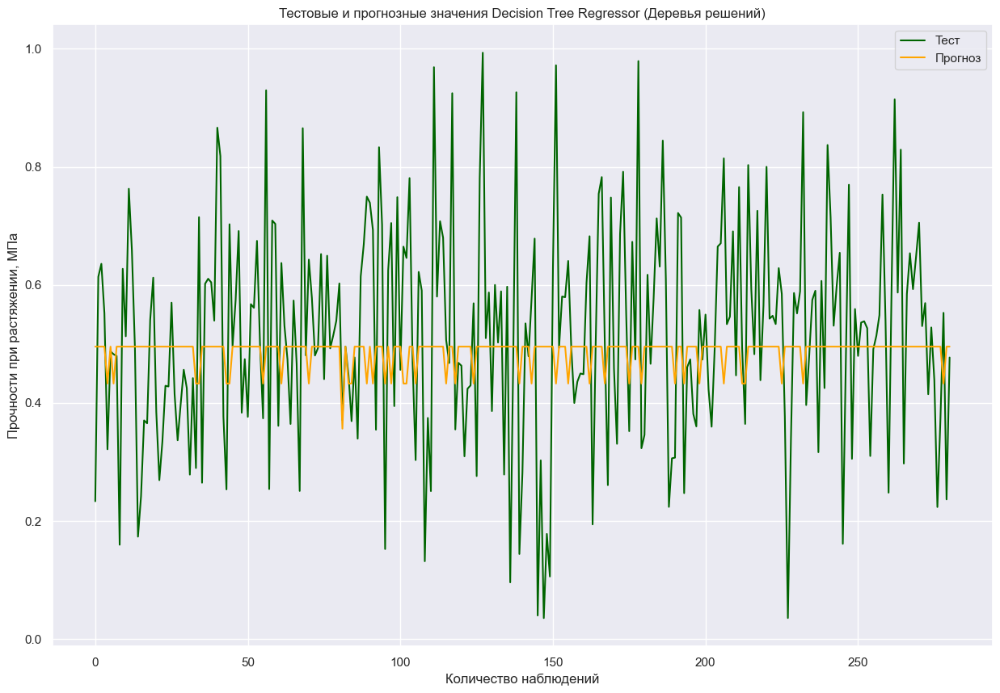

In [71]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения Decision Tree Regressor (Деревья решений)")
plt.plot(y_pr_test.values, label = "Тест", color = 'darkgreen')
plt.plot(y_pr_pred_dtr, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочности при растяжении, МПа")
plt.legend(loc='best')
plt.show()

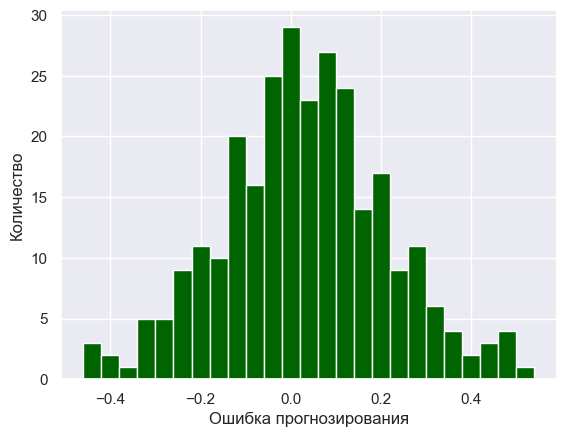

In [72]:
# Построим график распределения ошибки (таргет - Прочности при растяжении, МПа)
error = y_pr_test - y_pr_pred_dtr
plt.hist(error, bins=25, color = 'darkgreen')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

### Random Forest Regressor (Cлучайный лес)

#### Прогноз "Модуля упругости при растяжении, ГПа" (data_mod)

In [73]:
rf_reg = RandomForestRegressor(random_state = 42)

In [74]:
# Создаем сетку параметров на основе результатов случайного поиска 
param_rf = {
    'n_estimators' : range(0, 101, 25),
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : range(1, 5, 1),
};

In [75]:
# Создаем модель поиска по сетке
grid_search_rf_reg = GridSearchCV(estimator = rf_reg, param_grid = param_rf, cv = 10, n_jobs = -1)

In [76]:
# Обучаем модель (таргет - Модуля упругости при растяжении, ГПа)
grid_search_rf_reg.fit(X_mod_train, y_mod_train);

C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
120 fits failed out of a total of 600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
120 fits failed with the following error:
Traceback (most recent call last):
  File "C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 392, in fit
    self._validate_estimator()
  File "C:\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 138, in _validate_estimator
    raise ValueError(
ValueError: n_estimators must be greater than zero, got 0.

  warnings.warn(some_fits_failed

In [77]:
# Ищем наилучшие параметры для модели
grid_search_rf_reg.best_params_

{'max_depth': 1, 'max_features': 'sqrt', 'n_estimators': 50}

In [78]:
# Рассчитываем score для тренировочной выборки (таргет - Модуля упругости при растяжении, ГПа)
print("Train score:", grid_search_rf_reg.score(X_mod_train, y_mod_train))

Train score: 0.015890760537060955


In [79]:
# Предсказываем значения "Модуля упругости при растяжении, ГПа"
y_mod_pred_rf = grid_search_rf_reg.predict(X_mod_test)

In [80]:
# Выводим результаты модели (таргет - Модуля упругости при растяжении, ГПа)
print('MAE:', mean_absolute_error(y_mod_test, y_mod_pred_rf)) 
print('MSE:', mean_squared_error(y_mod_test, y_mod_pred_rf)) 
print('r2:', r2_score(y_mod_test, y_mod_pred_rf))

MAE: 0.15091849224114415
MSE: 0.03464460348306704
r2: -0.0005083283733648969


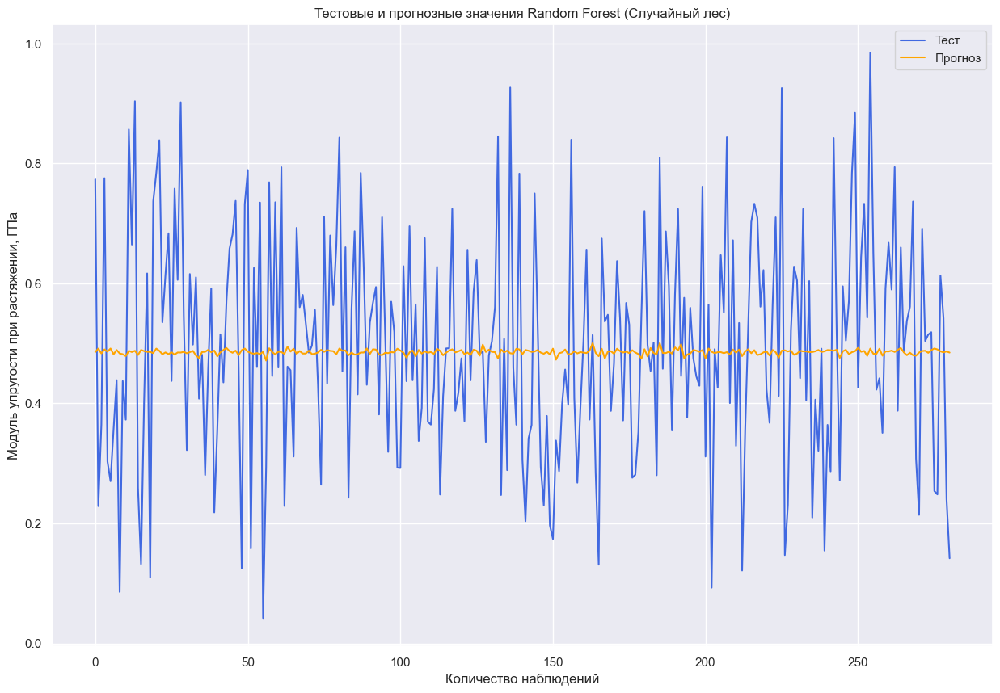

In [81]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения Random Forest (Cлучайный лес)")
plt.plot(y_mod_test.values, label = "Тест", color = 'royalblue')
plt.plot(y_mod_pred_rf, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend(loc='best')
plt.show()

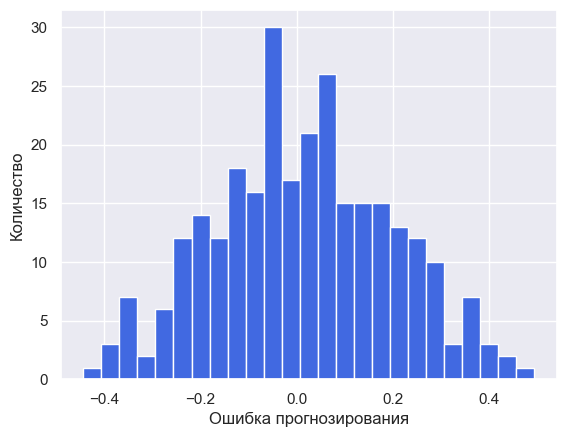

In [82]:
# Построим график распределения ошибки (таргет - Модуля упругости при растяжении, ГПа)
error = y_mod_test - y_mod_pred_rf
plt.hist(error, bins=25, color = 'royalblue')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

#### Прогноз "Прочность при растяжении, МПа" (data_pr)

In [83]:
# Обучаем модель (таргет - Прочности при растяжении, МПа)
rf_reg = RandomForestRegressor(random_state = 42)
param_rf = {
    'n_estimators' : range(0, 101, 25),
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : range(1, 5, 1),
};

grid_search_rf_reg = GridSearchCV(estimator = rf_reg, param_grid = param_rf, 
                          cv = 10, n_jobs = -1)
grid_search_rf_reg.fit(X_pr_train, y_pr_train)
grid_search_rf_reg.best_params_

C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
120 fits failed out of a total of 600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
120 fits failed with the following error:
Traceback (most recent call last):
  File "C:\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 392, in fit
    self._validate_estimator()
  File "C:\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 138, in _validate_estimator
    raise ValueError(
ValueError: n_estimators must be greater than zero, got 0.

  warnings.warn(some_fits_failed

{'max_depth': 1, 'max_features': 'sqrt', 'n_estimators': 100}

In [84]:
# Рассчитываем score для тренировочной выборки (таргет - Прочности при растяжении, МПа)
print("Train score:", grid_search_rf_reg.score(X_pr_train, y_pr_train))

Train score: 0.02734751859721063


In [85]:
# Предсказываем значения "Прочности при растяжении, МПа"
y_pr_pred_rf = grid_search_rf_reg.predict(X_pr_test)

In [86]:
# Выводим результаты модели (таргет - Прочности при растяжении, МПа)
print('MAE:', mean_absolute_error(y_pr_test, y_pr_pred_rf)) 
print('MSE:', mean_squared_error(y_pr_test, y_pr_pred_rf)) 
print('r2:', r2_score(y_pr_test, y_pr_pred_rf))

MAE: 0.14701483233106302
MSE: 0.034962637881081816
r2: -0.032641534422457985


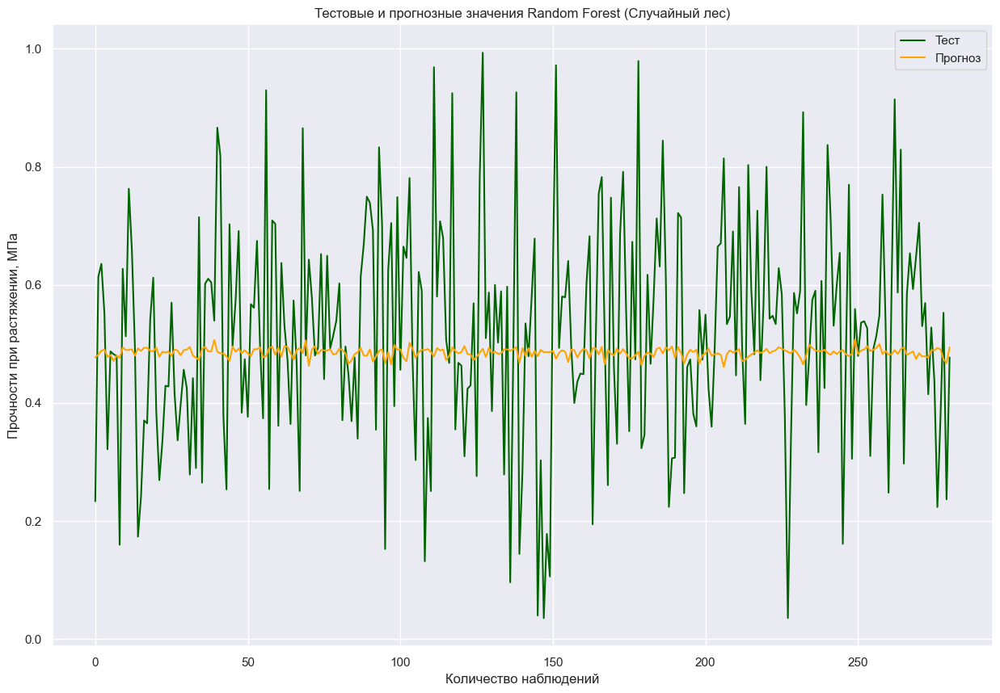

In [87]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения Random Forest (Cлучайный лес)")
plt.plot(y_pr_test.values, label = "Тест", color = 'darkgreen')
plt.plot(y_pr_pred_rf, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочности при растяжении, МПа")
plt.legend(loc='best')
plt.show()

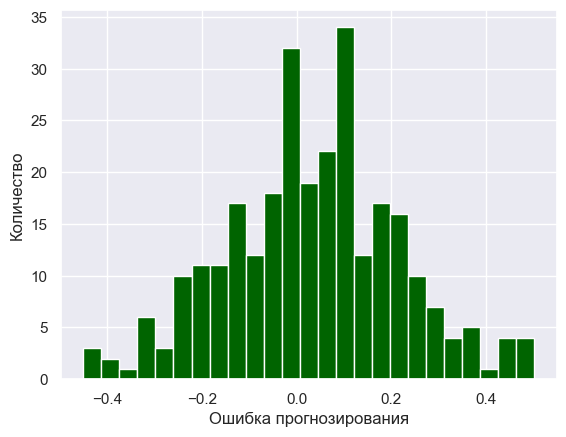

In [88]:
# Построим график распределения ошибки (таргет - Прочности при растяжении, МПа)
error = y_pr_test - y_pr_pred_rf
plt.hist(error, bins=25, color = 'darkgreen')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

### KNeighborsRegressor (Метод К ближайших соседей)

#### Прогноз "Модуля упругости при растяжении, ГПа" (data_mod)

In [89]:
knn = KNeighborsRegressor()

In [90]:
# Создаем сетку параметров на основе результатов случайного поиска 
param_knn = {'n_neighbors': [1,2,3,5,7,10],
            'weights': ['uniform', 'distance'],
            'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

In [91]:
# Создаем модель поиска по сетке
grid_search_knn = GridSearchCV(estimator = knn, param_grid = param_knn, cv = 10)

In [92]:
# Обучаем модель (таргет - Модуля упругости при растяжении, ГПа)
grid_search_knn.fit(X_mod_train, y_mod_train)

GridSearchCV(cv=10, estimator=KNeighborsRegressor(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [1, 2, 3, 5, 7, 10],
                         'weights': ['uniform', 'distance']})

In [93]:
# Ищем наилучшие параметры для модели
grid_search_knn.best_params_

{'algorithm': 'auto', 'n_neighbors': 10, 'weights': 'uniform'}

In [94]:
# Рассчитываем score для тренировочной выборки (таргет - Модуля упругости при растяжении, ГПа)
print("Train score:", grid_search_knn.score(X_mod_train, y_mod_train))

Train score: 0.07025052126218023


In [95]:
# Предсказываем значения "Модуля упругости при растяжении, ГПа"
y_mod_pred_knn = grid_search_knn.predict(X_mod_test)

In [96]:
# Выводим результаты модели (таргет - Модуля упругости при растяжении, ГПа)
print('MAE:', mean_absolute_error(y_mod_test, y_mod_pred_knn)) 
print('MSE:', mean_squared_error(y_mod_test, y_mod_pred_knn)) 
print('r2:', r2_score(y_mod_test, y_mod_pred_knn))

MAE: 0.1583874524755169
MSE: 0.03817420672512416
r2: -0.10244043567133954


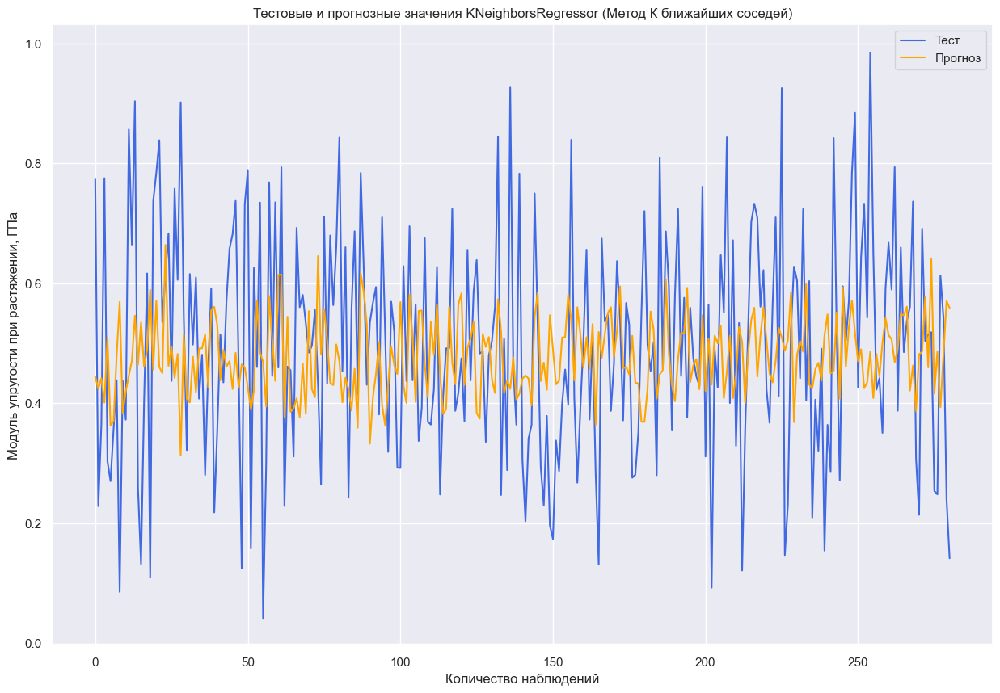

In [97]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения KNeighborsRegressor (Метод К ближайших соседей)")
plt.plot(y_mod_test.values, label = "Тест", color = 'royalblue')
plt.plot(y_mod_pred_knn, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend(loc='best')
plt.show()

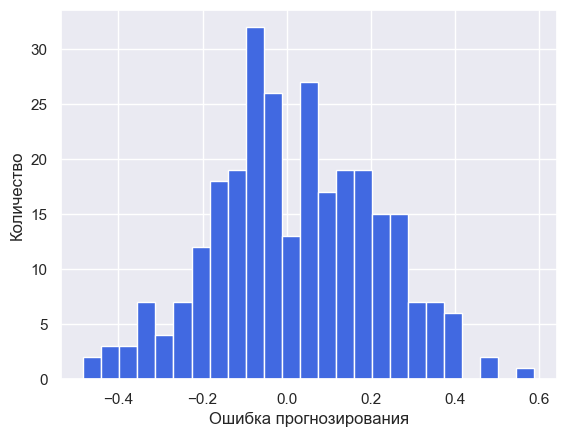

In [98]:
# Построим график распределения ошибки (таргет - Модуля упругости при растяжении, ГПа)
error = y_mod_test - y_mod_pred_knn
plt.hist(error, bins=25, color = 'royalblue')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

#### Прогноз "Прочность при растяжении, МПа" (data_pr)

In [99]:
knn = KNeighborsRegressor()

In [100]:
# Создаем сетку параметров на основе результатов случайного поиска 
param_knn = {'n_neighbors': [1,2,3,5,7,10],
            'weights': ['uniform', 'distance'],
            'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

In [101]:
# Создаем модель поиска по сетке
grid_search_knn = GridSearchCV(estimator = knn, param_grid = param_knn, cv = 10)

In [102]:
# Обучаем модель (таргет - Модуля упругости при растяжении, ГПа)
grid_search_knn.fit(X_pr_train, y_pr_train);

In [103]:
# Ищем наилучшие параметры для модели
grid_search_knn.best_params_

{'algorithm': 'brute', 'n_neighbors': 10, 'weights': 'distance'}

In [104]:
# Рассчитываем score для тренировочной выборки (таргет - Модуля упругости при растяжении, ГПа)
print("Train score:", grid_search_knn.score(X_pr_train, y_pr_train))

Train score: 0.9999999999999403


In [105]:
# Предсказываем значения "Модуля упругости при растяжении, ГПа"
y_pr_pred_knn = grid_search_knn.predict(X_pr_test)

In [106]:
# Выводим результаты модели (таргет - Модуля упругости при растяжении, ГПа)
print('MAE:', mean_absolute_error(y_pr_test, y_pr_pred_knn)) 
print('MSE:', mean_squared_error(y_pr_test, y_pr_pred_knn)) 
print('r2:', r2_score(y_pr_test, y_pr_pred_knn))

MAE: 0.15316372398687622
MSE: 0.038854666135742094
r2: -0.1475948180556319


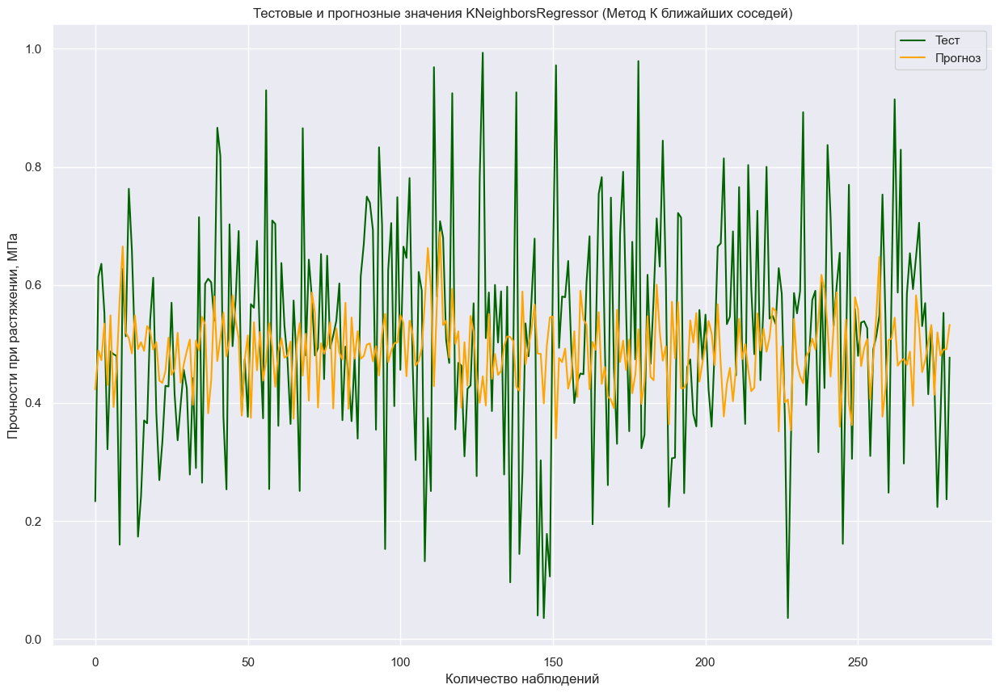

In [107]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения KNeighborsRegressor (Метод К ближайших соседей)")
plt.plot(y_pr_test.values, label = "Тест", color = 'darkgreen')
plt.plot(y_pr_pred_knn, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочности при растяжении, МПа")
plt.legend(loc='best')
plt.show()

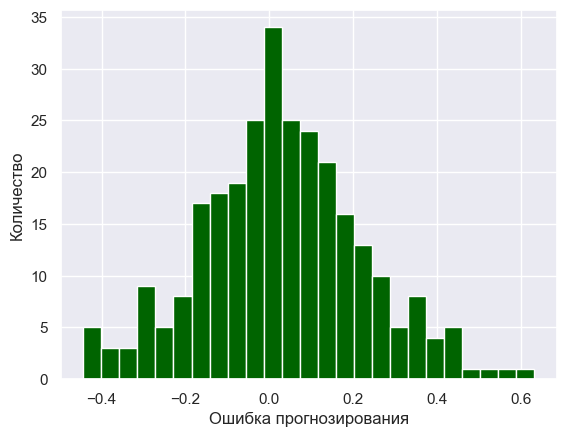

In [108]:
# Построим график распределения ошибки (таргет - Прочности при растяжении, МПа)
error = y_pr_test - y_pr_pred_knn
plt.hist(error, bins=25, color = 'darkgreen')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

### Support Vector Machines (Метод опорных векторов)

#### Прогноз "Модуля упругости при растяжении, ГПа" (data_mod)

In [109]:
svr = SVR()

In [110]:
# Создаем сетку параметров на основе результатов случайного поиска 
param_svr = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
             'gamma': ['scale', 'auto'],
             'shrinking': [True, False],
}

In [111]:
# Создаем модель поиска по сетке
grid_search_svr = GridSearchCV(estimator = svr, param_grid = param_svr, cv = 10, n_jobs=-1)

In [112]:
# Обучаем модель (таргет - Модуля упругости при растяжении, ГПа)
grid_search_svr.fit(X_mod_train, y_mod_train)

GridSearchCV(cv=10, estimator=SVR(), n_jobs=-1,
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
                         'shrinking': [True, False]})

In [113]:
# Ищем наилучшие параметры для модели
grid_search_svr.best_params_

{'gamma': 'auto', 'kernel': 'poly', 'shrinking': True}

In [114]:
# Рассчитываем score для тренировочной выборки (таргет - Модуля упругости при растяжении, ГПа)
print("Train score:", grid_search_svr.score(X_mod_train, y_mod_train))

Train score: 0.023628786541364688


In [115]:
# Предсказываем значения "Модуля упругости при растяжении, ГПа"
y_mod_pred_svr = grid_search_svr.predict(X_mod_test)

In [116]:
# Выводим результаты модели (таргет - Модуля упругости при растяжении, ГПа)
print('MAE:', mean_absolute_error(y_mod_test, y_mod_pred_svr)) 
print('MSE:', mean_squared_error(y_mod_test, y_mod_pred_svr)) 
print('r2:', r2_score(y_mod_test, y_mod_pred_svr))

MAE: 0.15091911283998957
MSE: 0.03427083962836393
r2: 0.010285671611601543


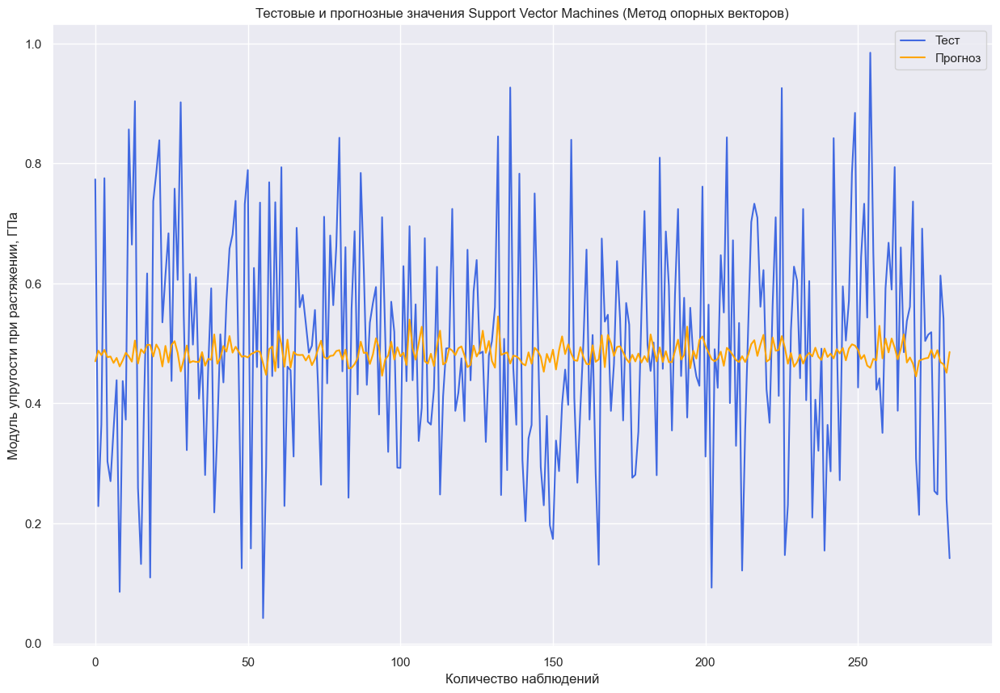

In [117]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения Support Vector Machines (Метод опорных векторов)")
plt.plot(y_mod_test.values, label = "Тест", color = 'royalblue')
plt.plot(y_mod_pred_svr, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend(loc='best')
plt.show()

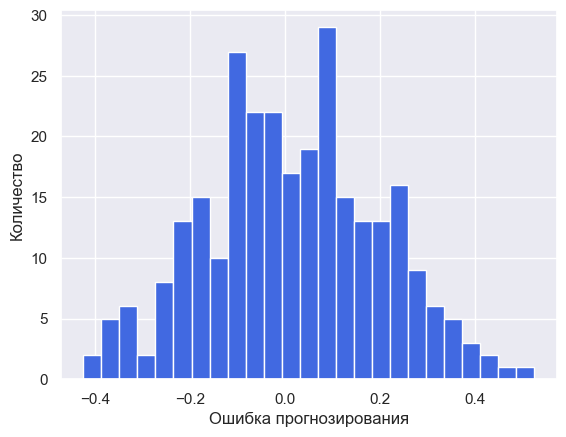

In [118]:
# Построим график распределения ошибки (таргет - Модуля упругости при растяжении, ГПа)
error = y_mod_test - y_mod_pred_svr
plt.hist(error, bins=25, color = 'royalblue')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

#### Прогноз "Прочность при растяжении, МПа" (data_pr)

In [119]:
svr = SVR()

In [120]:
# Создаем сетку параметров на основе результатов случайного поиска 
param_svr = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
             'gamma': ['scale', 'auto'],
             'shrinking': [True, False],
}

In [121]:
# Создаем модель поиска по сетке
grid_search_svr = GridSearchCV(estimator = svr, param_grid = param_svr, cv = 10, n_jobs=-1)

In [122]:
# Обучаем модель (таргет - Модуля упругости при растяжении, ГПа)
grid_search_svr.fit(X_pr_train, y_pr_train)

GridSearchCV(cv=10, estimator=SVR(), n_jobs=-1,
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
                         'shrinking': [True, False]})

In [123]:
# Ищем наилучшие параметры для модели
grid_search_svr.best_params_

{'gamma': 'auto', 'kernel': 'poly', 'shrinking': True}

In [124]:
# Рассчитываем score для тренировочной выборки (таргет - Модуля упругости при растяжении, ГПа)
print("Train score:", grid_search_svr.score(X_pr_train, y_pr_train))

Train score: 0.031339762193664966


In [125]:
# Предсказываем значения "Модуля упругости при растяжении, ГПа"
y_pr_pred_svr = grid_search_svr.predict(X_pr_test)

In [126]:
# Выводим результаты модели (таргет - Модуля упругости при растяжении, ГПа)
print('MAE:', mean_absolute_error(y_pr_test, y_pr_pred_svr)) 
print('MSE:', mean_squared_error(y_pr_test, y_pr_pred_svr)) 
print('r2:', r2_score(y_pr_test, y_pr_pred_svr))

MAE: 0.1475987709458906
MSE: 0.03516603180905233
r2: -0.03864889057750753


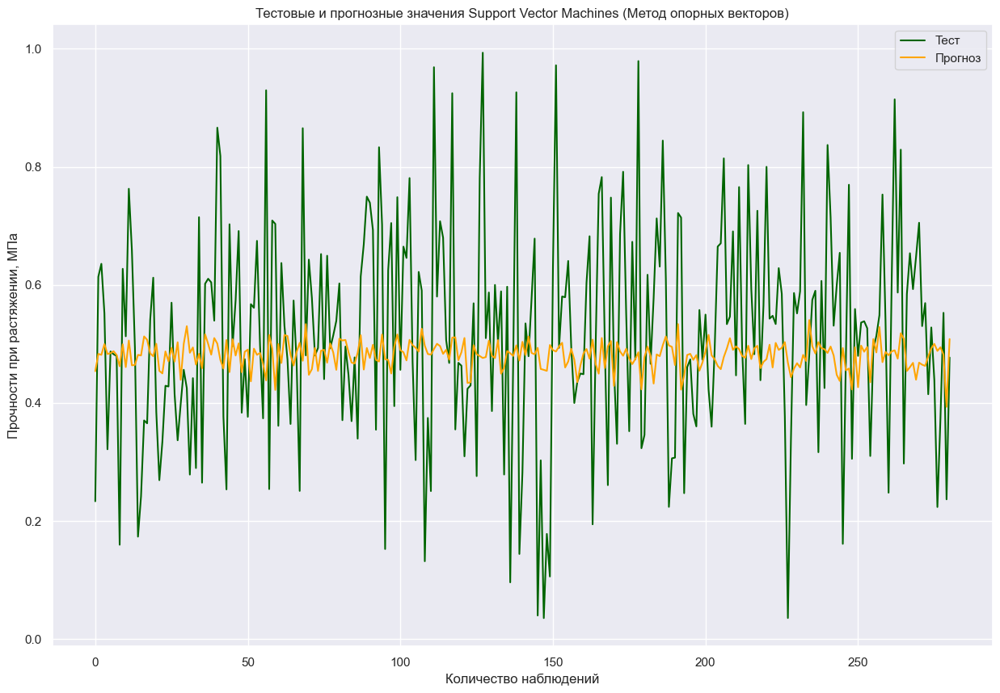

In [127]:
# Построим график предсказанных и фактических значений по тестовой выборке
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения Support Vector Machines (Метод опорных векторов)")
plt.plot(y_pr_test.values, label = "Тест", color = 'darkgreen')
plt.plot(y_pr_pred_svr, label = "Прогноз", color = 'orange')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочности при растяжении, МПа")
plt.legend(loc='best')
plt.show()

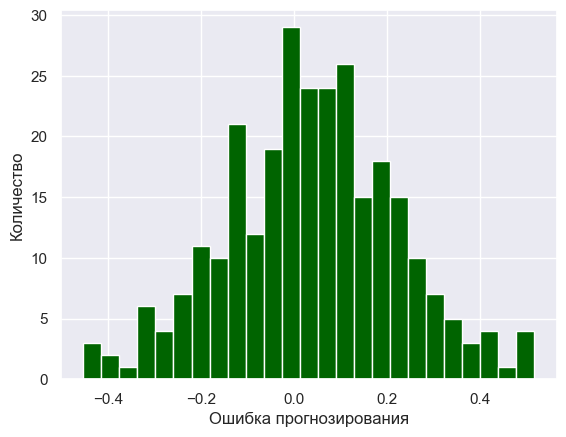

In [128]:
# Построим график распределения ошибки (таргет - Прочности при растяжении, МПа)
error = y_pr_test - y_pr_pred_svr
plt.hist(error, bins=25, color = 'darkgreen')
plt.xlabel('Ошибка прогнозирования')
plt.ylabel('Количество')
plt.show()

### Нейронная сеть для соотношения матрица-наполнитель¶

In [129]:
# Записываем независимые переменные из norm_data в X_matr, а зависимую "Соотношение матрица-наполнитель" в y_matr

X_matr = data_ncl.drop(['Соотношение матрица-наполнитель'], axis = 1)
y_matr = data_ncl['Соотношение матрица-наполнитель']

In [130]:
X_matr.head()

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.289334,0.557156
1,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.335840
2,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.506083
3,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.557156
4,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.727399


In [131]:
# Делим данные из на тестовую и тренировочную выборки 

X_matr_train, X_matr_test, y_matr_train, y_matr_test = train_test_split(X_matr, y_matr, test_size = 0.30, random_state=42)

In [132]:
# Проверка правильности разбивки

print("Форма тренировочной выборки: ",  X_matr_train.shape)
print("Форма тестового выборки: ", X_matr_test.shape)

data_ncl.shape[0] - X_matr_train.shape[0] - X_matr_test.shape[0]

Форма тренировочной выборки:  (655, 12)
Форма тестового выборки:  (281, 12)


0

In [146]:
# Создадим нейронную сеть для предсказания параметра "Соотношение матрица-наполнитель"
# Создадим модель помощью класса Sequential, который предполагает, что выходы одного слоя идут на следующий слой
model1 = Sequential()
# Добавим входной слой
model1.add(Dense(128, input_dim=X_matr_train.shape[1], activation='relu'))
# Добавим скрытые слои
model1.add(Dense(64, activation='relu'))
model1.add(Dense(32, activation='relu'))
model1.add(Dense(16, activation='relu'))
model1.add(Dense(8, activation='relu'))
model1.add(Dense(4, activation='relu'))
model1.add(Dense(2, activation='relu'))
# Добавим выходной слой
model1.add(Dense(1))
# Компилируем модель
model1.compile(loss='mse', optimizer='adam', metrics=['mae'])
# Выведем информацию о модели
model1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13 (Dense)            (None, 128)               1664      
                                                                 
 dense_14 (Dense)            (None, 64)                8256      
                                                                 
 dense_15 (Dense)            (None, 32)                2080      
                                                                 
 dense_16 (Dense)            (None, 16)                528       
                                                                 
 dense_17 (Dense)            (None, 8)                 136       
                                                                 
 dense_18 (Dense)            (None, 4)                 36        
                                                                 
 dense_19 (Dense)            (None, 2)                

In [147]:
# Обучим модель, отправляя 20% данных на валидационную выборку
history1 = model1.fit(X_matr_train, y_matr_train, epochs=60, batch_size=100, validation_split=0.2, verbose=1)

Epoch 1/60
6/6 [==============================] - 2s 43ms/step - loss: 0.2824 - mae: 0.4961 - val_loss: 0.2731 - val_mae: 0.4894
Epoch 2/60
6/6 [==============================] - 0s 12ms/step - loss: 0.2673 - mae: 0.4808 - val_loss: 0.2552 - val_mae: 0.4707
Epoch 3/60
6/6 [==============================] - 0s 13ms/step - loss: 0.2477 - mae: 0.4600 - val_loss: 0.2307 - val_mae: 0.4439
Epoch 4/60
6/6 [==============================] - 0s 13ms/step - loss: 0.2197 - mae: 0.4288 - val_loss: 0.1946 - val_mae: 0.4017
Epoch 5/60
6/6 [==============================] - 0s 12ms/step - loss: 0.1775 - mae: 0.3784 - val_loss: 0.1413 - val_mae: 0.3334
Epoch 6/60
6/6 [==============================] - 0s 12ms/step - loss: 0.1202 - mae: 0.2970 - val_loss: 0.0755 - val_mae: 0.2290
Epoch 7/60
6/6 [==============================] - 0s 11ms/step - loss: 0.0596 - mae: 0.1990 - val_loss: 0.0359 - val_mae: 0.1524
Epoch 8/60
6/6 [==============================] - 0s 12ms/step - loss: 0.0455 - mae: 0.1706 - val

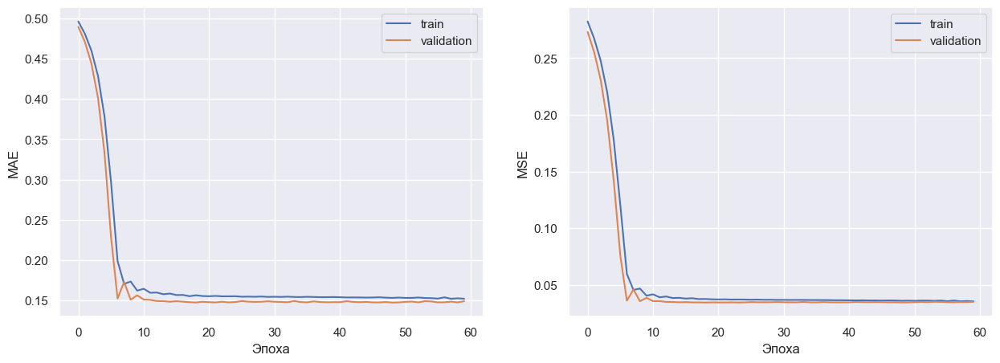

In [148]:
# Построим графики MAE и MSE на обучающей и валидационной выборках
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(history1.history['mae'])
ax[0].plot(history1.history['val_mae'])
ax[0].set_xlabel('Эпоха')
ax[0].set_ylabel('MAE')
ax[0].legend(['train', 'validation'], loc='upper right')
ax[1].plot(history1.history['loss'])
ax[1].plot(history1.history['val_loss'])
ax[1].set_xlabel('Эпоха')
ax[1].set_ylabel('MSE')
ax[1].legend(['train', 'validation'], loc='upper right')
plt.show()

9/9 [==============================] - 0s 2ms/step


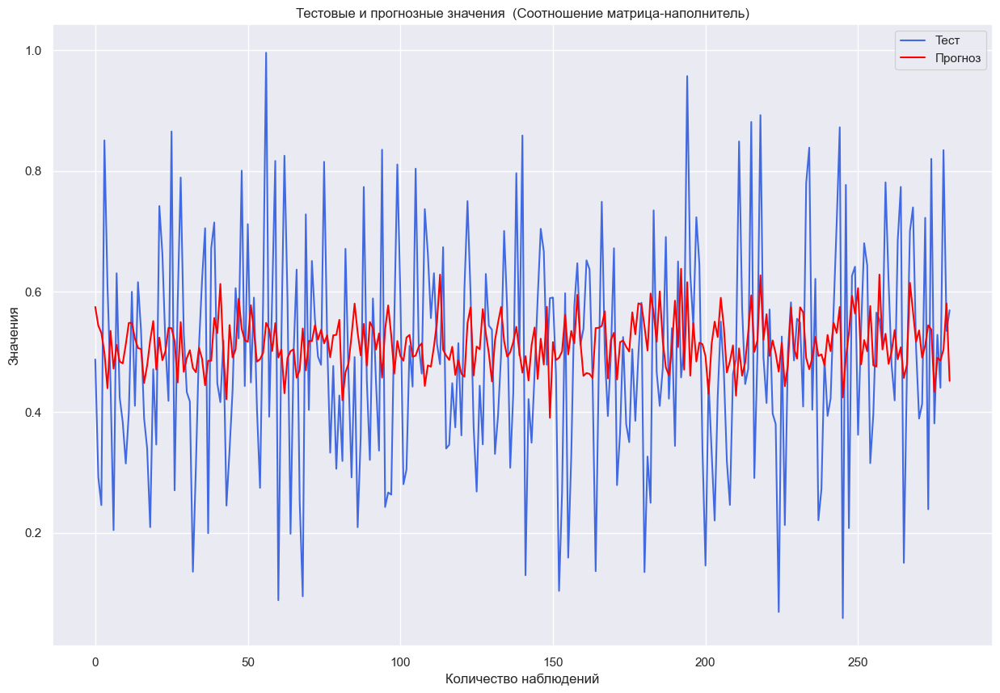

In [149]:
# Построим график предсказанных и фактических значений по тестовой выборке
y_matr_pred1 = model1.predict(X_matr_test)
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения  (Соотношение матрица-наполнитель)")
plt.plot(y_matr_test.values, label = "Тест", color = 'royalblue')
plt.plot(y_matr_pred1, label = "Прогноз", color = 'red')
plt.xlabel("Количество наблюдений")
plt.ylabel("Значения")
plt.legend(loc='best')
plt.show()

In [137]:
# Выведем метрики
print('MAE:', mean_absolute_error(y_matr_test, y_matr_pred1))
print('MSE:', mean_squared_error(y_matr_test, y_matr_pred1))
print('r2:', r2_score(y_matr_test, y_matr_pred1))
print ('r2 train:', r2_score(y_matr_train, model1.predict(X_matr_train)))

MAE: 0.2233344721780321
MSE: 0.07294389315965209
r2: -1.175985708351138
21/21 [==============================] - 0s 2ms/step
r2 train: -1.183687097651812


In [138]:
# Создадим ещё одну модель, добавим прореживание Dropout

model2 = Sequential()
# Добавим входной слой
model2.add(Dense(64, input_dim=X_matr_train.shape[1], activation='relu'))
model2.add(Dropout(0.12))
model2.add(Dense(32, activation='relu'))
model2.add(Dropout(0.12))
model2.add(Dense(16, activation='relu'))
model2.add(Dropout(0.12))
model2.add(Dense(8, activation='tanh'))
# Добавим выходной слой
model2.add(Dense(1))
# Компилируем модель
model2.compile(loss='mse', optimizer='adam', metrics=['mae'])
# Выведем информацию о модели
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 64)                832       
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_9 (Dense)             (None, 32)                2080      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_10 (Dense)            (None, 16)                528       
                                                                 
 dropout_2 (Dropout)         (None, 16)                0         
                                                                 
 dense_11 (Dense)            (None, 8)                

In [139]:
# Обучим модель, отправляя 20% данных на валидационную выборку
history2 = model2.fit(X_matr_train, y_matr_train, epochs=60, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/60
17/17 [==============================] - 1s 15ms/step - loss: 0.0691 - mae: 0.2096 - val_loss: 0.0443 - val_mae: 0.1674
Epoch 2/60
17/17 [==============================] - 0s 6ms/step - loss: 0.0489 - mae: 0.1769 - val_loss: 0.0391 - val_mae: 0.1564
Epoch 3/60
17/17 [==============================] - 0s 5ms/step - loss: 0.0466 - mae: 0.1749 - val_loss: 0.0374 - val_mae: 0.1544
Epoch 4/60
17/17 [==============================] - 0s 6ms/step - loss: 0.0474 - mae: 0.1724 - val_loss: 0.0361 - val_mae: 0.1518
Epoch 5/60
17/17 [==============================] - 0s 5ms/step - loss: 0.0428 - mae: 0.1681 - val_loss: 0.0364 - val_mae: 0.1516
Epoch 6/60
17/17 [==============================] - 0s 4ms/step - loss: 0.0428 - mae: 0.1662 - val_loss: 0.0365 - val_mae: 0.1516
Epoch 7/60
17/17 [==============================] - 0s 6ms/step - loss: 0.0427 - mae: 0.1658 - val_loss: 0.0354 - val_mae: 0.1498
Epoch 8/60
17/17 [==============================] - 0s 5ms/step - loss: 0.0374 - mae: 0.1

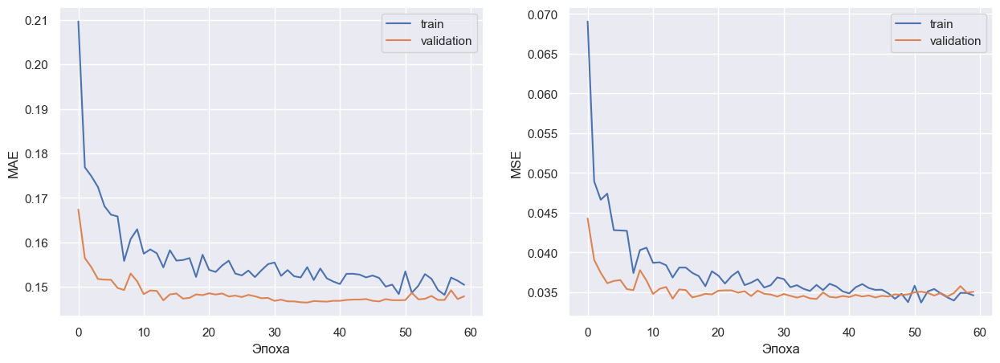

In [140]:
# Построим графики MAE и MSE на обучающей и валидационной выборках
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(history2.history['mae'])
ax[0].plot(history2.history['val_mae'])
ax[0].set_xlabel('Эпоха')
ax[0].set_ylabel('MAE')
ax[0].legend(['train', 'validation'], loc='upper right')
ax[1].plot(history2.history['loss'])
ax[1].plot(history2.history['val_loss'])
ax[1].set_xlabel('Эпоха')
ax[1].set_ylabel('MSE')
ax[1].legend(['train', 'validation'], loc='upper right')
plt.show()

9/9 [==============================] - 0s 4ms/step


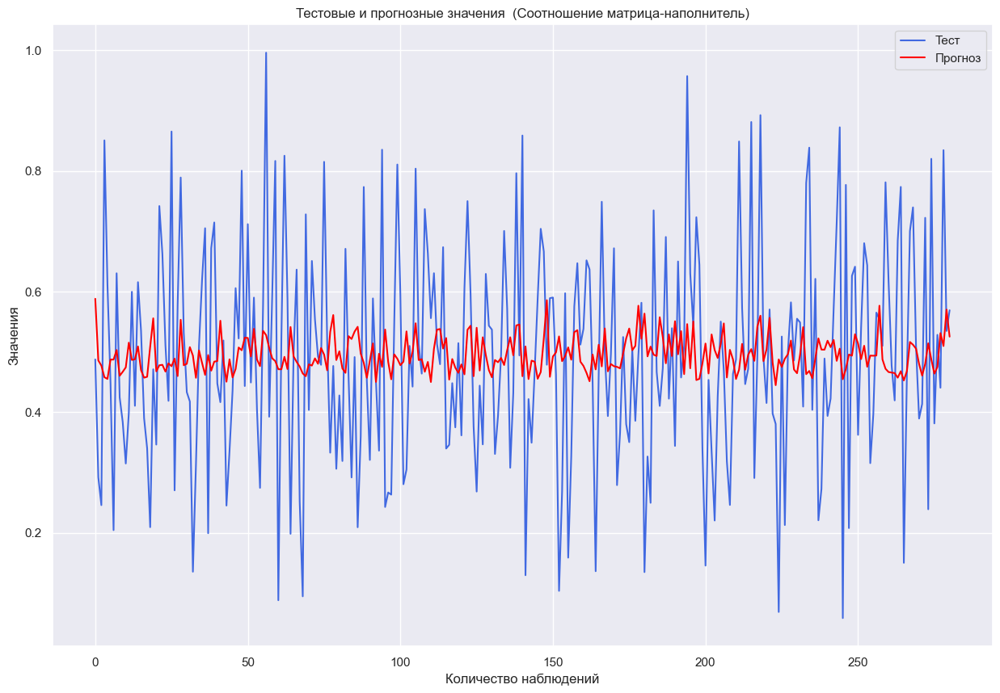

In [141]:
# Построим график предсказанных и фактических значений по тестовой выборке
y_matr_pred2 = model2.predict(X_matr_test)
plt.figure(figsize = (15, 10))
plt.title("Тестовые и прогнозные значения  (Соотношение матрица-наполнитель)")
plt.plot(y_matr_test.values, label = "Тест", color = 'royalblue')
plt.plot(y_matr_pred2, label = "Прогноз", color = 'red')
plt.xlabel("Количество наблюдений")
plt.ylabel("Значения")
plt.legend(loc='best')
plt.show()

In [142]:
# Выведем метрики
print('MAE:', mean_absolute_error(y_matr_test, y_matr_pred2))
print('MSE:', mean_squared_error(y_matr_test, y_matr_pred2))
print('r2:', r2_score(y_matr_test, y_matr_pred2))
print ('r2 train:', r2_score(y_matr_train, model2.predict(X_matr_train)))

MAE: 0.14888221252415185
MSE: 0.0345708323101514
r2: -0.03128080740147876
21/21 [==============================] - 0s 2ms/step
r2 train: 0.07005990970072518


### Создание приложения

In [143]:
# Импортируем библиотеки
from flask import Flask, request, render_template
import pickle

In [144]:
# Сохраним модель model2 с помощью pickle
pickle.dump(model2, open('model2.pkl', 'wb'))

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\dropout
......vars
...layers\dropout_1
......vars
...layers\dropout_2
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........3
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-04-05 21:32:47         3100
metadata.json  

In [145]:
app = Flask(__name__)

@app.route('/', methods=['GET', 'POST'])
def calculate():
    text_result = ''
    error = dict()
    if request.method == 'POST':
        data = request.form
        data1 = {k:[float(v)] for k,v in data.items()}
        input = pd.DataFrame(data=data1)
        result = model2.pkl.predict(input)[0][0]
        text_result = '{column} = {data:.5f}'.format(column='Соотношение матрица-наполнитель', data=result)
    return render_template('index.html', result=text_result, error=error)

if __name__ == '__main__':
        app.run(debug=True)

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


 * Restarting with watchdog (windowsapi)


SystemExit: 1

C:\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3465: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)
